In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

%matplotlib inline

In [2]:
playstore_df = pd.read_csv('/kaggle/input/playstore-dataset/Playstore_final.csv', on_bad_lines = 'skip')

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3553: DtypeWarning: Columns (7,12) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
playstore_df.head()

,App Name,App Id,Category,Rating,Rating Count,Installs,Minimum Installs,Free,Price,Currency,...,Ad Supported,In app purchases,Editor Choice,Summary,Reviews,Android version Text,Developer,Developer Address,Developer Internal ID,Version
0,Logistics Management,com.eniseistudio.logistics_management,Education,4.090909,66.0,"10,000+",10000.0,True,0.0,USD,...,True,False,False,Leading Online Learning and Training System in...,28.0,4.0 and up,eniseistudio,"7115 N Muscatel Ave San Gabriel, CA 91775 Unit...",4.656447e+18,1.1.5
1,Estados Unidos Noticias,com.eniseistudio.news.estados_unidos,News & Magazines,4.000000,8.0,"1,000+",1000.0,True,0.0,USD,...,True,False,False,Top Stories\r\nWorld\r\nEntertainment\r\nSport...,3.0,4.0 and up,eniseistudio,"7115 N Muscatel Ave San Gabriel, CA 91775 Unit...",4.656447e+18,1.2.3
2,Dental Assistant,com.eniseistudio.dental_assistant,Education,3.866667,15.0,"10,000+",10000.0,True,0.0,USD,...,True,False,False,"Dental Assistant: Study Dental Assistant, Dent...",3.0,4.0 and up,eniseistudio,"7115 N Muscatel Ave San Gabriel, CA 91775 Unit...",4.656447e+18,1.1.5
3,Medical Assistant,com.eniseistudio.course.medical_assistant,Education,4.000000,18.0,"5,000+",5000.0,True,0.0,USD,...,True,False,False,Medical Assistant Degree Medical Assistant Job...,7.0,4.0 and up,eniseistudio,"7115 N Muscatel Ave San Gabriel, CA 91775 Unit...",4.656447e+18,1.1.4
4,Business Administration,com.eniseistudio.majors.course.business_admini...,Education,4.023256,86.0,"50,000+",50000.0,True,0.0,USD,...,True,False,False,"Business Administration Learning, Business Adm...",29.0,4.0 and up,eniseistudio,"7115 N Muscatel Ave San Gabriel, CA 91775 Unit...",4.656447e+18,1.1.6


In [4]:
playstore_df.columns

Index(['App Name', 'App Id', 'Category', 'Rating', 'Rating Count', 'Installs',
       'Minimum Installs', 'Free', 'Price', 'Currency', 'Size',
       'Minimum Android', 'Developer Id', 'Developer Website',
       'Developer Email', 'Released', 'Last update', 'Privacy Policy',
       'Content Rating', 'Ad Supported', 'In app purchases', 'Editor Choice',
       'Summary', 'Reviews', 'Android version Text', 'Developer',
       'Developer Address', 'Developer Internal ID', 'Version'],
      dtype='object')

In [5]:
col_required = ['App Name', 'App Id', 'Category', 'Rating', 'Rating Count', 'Installs',
                'Free', 'Price', 'Currency', 'Released', 'Content Rating', 
                'In app purchases', 'Editor Choice', 'Reviews', 'Developer']

playstore_df = playstore_df[col_required]

In [6]:
playstore_df.sample(10)

,App Name,App Id,Category,Rating,Rating Count,Installs,Free,Price,Currency,Released,Content Rating,In app purchases,Editor Choice,Reviews,Developer
200320,ÖN Nyheter,fi.ksfmedia.ostnyland,News & Magazines,4.500000,10.0,"1,000+",True,0.0,USD,"May 25, 2020",Everyone,False,False,4.0,KSF Media AB
312269,boditrax,ro.artsoft.boditrax,Health & Fitness,2.800000,186.0,"50,000+",True,0.0,USD,"Feb 27, 2017",Everyone,False,False,131.0,Boditrax Technologies Ltd
209555,My Elevation,com.rdh.mulligan.myelevation,Travel & Local,4.660987,17012.0,"1,000,000+",True,0.0,USD,"Jan 28, 2014",Everyone,False,False,6783.0,RDH Software
75816,"Shoppaz - Find it, love it, buy it.",com.mobilefibre.shoppaz,Shopping,0.000000,NaN,100+,True,0.0,USD,"Dec 6, 2019",Everyone,False,False,0.0,Umojami Tribe.
216841,Truck Simulation - European Truck Driving Game,com.soy.truck,Simulation,0.000000,NaN,100+,True,0.0,USD,"Mar 21, 2018",Everyone,False,False,0.0,Casual Games For Fun
204002,لعبة أطلس العالم : أعلام، عواصم، خرائط، مآثر...,com.raciloni.atlas_arabic,Educational,3.530000,183.0,"10,000+",True,0.0,USD,"Jun 11, 2018",Everyone,False,False,97.0,Adil Gounane
177911,YourFitWay,com.pl.yourfitwayltd.adambartosik.yourfitway,Health & Fitness,NaN,NaN,"50,000+",True,0.0,USD,NaN,Everyone,False,False,NaN,YOUR FIT WAY NETWORK OÜ
166348,Dinosaur Egg - pop bubble shoot,com.gamestudio.bubbledragon.shootereggpop,Puzzle,4.230000,192.0,"50,000+",True,0.0,USD,43102,Everyone,False,False,62.0,Toy box Blast
278575,Istibsaar,com.talabulilm.istibsaarmob,Education,4.390000,344.0,"10,000+",True,0.0,USD,"Aug 11, 2019",Everyone,False,False,116.0,Mahad al-Hasanaat al-Burhaniyah
18782,Offroad 3D Construction Game,com.gamezfeat.city.builder.machines,Simulation,3.809524,42.0,"10,000+",True,0.0,USD,"May 31, 2017",Everyone,False,False,17.0,Games Feat


In [7]:
playstore_df['App Id'].value_counts().value_counts()

1    394521
2     28136
Name: App Id, dtype: int64

In [8]:
playstore_df = playstore_df.sort_values(['App Id', 'Rating Count']).drop_duplicates('App Id', keep = 'last')
playstore_df['App Id'].value_counts().value_counts()

1    422657
Name: App Id, dtype: int64

In [9]:
playstore_df["Currency"].value_counts()

USD    400206
XXX     21867
EUR       101
INR        43
GBP        32
PKR        30
THB        27
HKD        22
TRY        21
RUB        21
VND        16
BGN        14
BDT        14
KRW        13
UAH        12
CAD        12
IDR        12
AUD        10
SGD         9
JPY         8
RSD         7
ZAR         6
ILS         5
PLN         5
PEN         5
CHF         5
DKK         4
BRL         4
AED         4
NGN         3
CZK         3
KES         3
EGP         2
MYR         2
SEK         2
TWD         2
MXN         2
NZD         2
LBP         1
KZT         1
TZS         1
COP         1
GHS         1
HUF         1
LKR         1
DZD         1
BOB         1
Name: Currency, dtype: int64

In [10]:
playstore_df.drop(playstore_df[~playstore_df['Currency'].isin(['USD','EUR','INR','GBP'])].index, inplace = True)
playstore_df.groupby('Currency')['Price'].agg(np.sum)

Currency
EUR         0.00000
GBP         0.00000
INR         0.00000
USD    134059.23188
Name: Price, dtype: float64

In [11]:
playstore_df.loc[playstore_df['Currency'].isin(['EUR','GBP','INR']),'Currency'] = 'USD'

In [12]:
playstore_df['Currency'].unique()

array(['USD'], dtype=object)

In [14]:
playstore_df.isna().sum()

App Name                0
App Id                  0
Category                0
Rating               2044
Rating Count        98216
Installs                0
Free                    0
Price                   0
Currency                0
Released             2622
Content Rating          0
In app purchases        0
Editor Choice           0
Reviews              2044
Developer               3
dtype: int64

In [15]:
playstore_df.drop(playstore_df[(playstore_df['Rating'].isna()) | (playstore_df['Rating']==0.0)].index, inplace = True)

In [16]:
playstore_df.drop(playstore_df[playstore_df['Released'].isna()].index, inplace = True)

In [20]:
playstore_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 301576 entries, 263102 to 231897
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   App Name          301576 non-null  object 
 1   App Id            301576 non-null  object 
 2   Category          301576 non-null  object 
 3   Rating            301576 non-null  float64
 4   Rating Count      301576 non-null  float64
 5   Installs          301576 non-null  object 
 6   Free              301576 non-null  object 
 7   Price             301576 non-null  float64
 8   Currency          301576 non-null  object 
 9   Released          301576 non-null  object 
 10  Content Rating    301576 non-null  object 
 11  In app purchases  301576 non-null  bool   
 12  Editor Choice     301576 non-null  bool   
 13  Reviews           301576 non-null  float64
 14  Developer         301574 non-null  object 
dtypes: bool(2), float64(4), object(9)
memory usage: 32.8+ MB


In [21]:
playstore_df['Rating Count'] = playstore_df['Rating Count'].astype(int)
playstore_df['Free'] = playstore_df['Free'].astype(bool)
playstore_df['Rating'] = playstore_df['Rating'].apply(lambda x: round(x,2))
playstore_df['Released'] = pd.to_datetime(playstore_df['Released'], errors = 'coerce')

In [22]:
playstore_df.isna().sum()

App Name                0
App Id                  0
Category                0
Rating                  0
Rating Count            0
Installs                0
Free                    0
Price                   0
Currency                0
Released            10316
Content Rating          0
In app purchases        0
Editor Choice           0
Reviews                 0
Developer               2
dtype: int64

In [23]:
playstore_df.dropna(subset = ['Released'], inplace = True)

In [24]:
playstore_df.isna().sum()

App Name            0
App Id              0
Category            0
Rating              0
Rating Count        0
Installs            0
Free                0
Price               0
Currency            0
Released            0
Content Rating      0
In app purchases    0
Editor Choice       0
Reviews             0
Developer           2
dtype: int64

In [25]:
playstore_df['Installs'] = playstore_df['Installs'].apply(lambda x: x[:-1]).replace(',', '', regex = True)
playstore_df['Installs']

263102     1000000
263099       50000
180418      100000
417205        1000
442193    50000000
            ...   
218982       10000
101857       10000
87694          100
150966        1000
231897      100000
Name: Installs, Length: 291260, dtype: object

In [26]:
playstore_df['Installs'] = playstore_df['Installs'].astype(np.int64)

In [27]:
playstore_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 291260 entries, 263102 to 231897
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   App Name          291260 non-null  object        
 1   App Id            291260 non-null  object        
 2   Category          291260 non-null  object        
 3   Rating            291260 non-null  float64       
 4   Rating Count      291260 non-null  int64         
 5   Installs          291260 non-null  int64         
 6   Free              291260 non-null  bool          
 7   Price             291260 non-null  float64       
 8   Currency          291260 non-null  object        
 9   Released          291260 non-null  datetime64[ns]
 10  Content Rating    291260 non-null  object        
 11  In app purchases  291260 non-null  bool          
 12  Editor Choice     291260 non-null  bool          
 13  Reviews           291260 non-null  float64       
 14 

In [28]:
installs_df = pd.DataFrame(playstore_df['Installs'].value_counts().sort_index())
installs_df

,Installs
0,24
1,21
5,23
10,737
50,1342
100,11025
500,12248
1000,53030
5000,28684
10000,66513


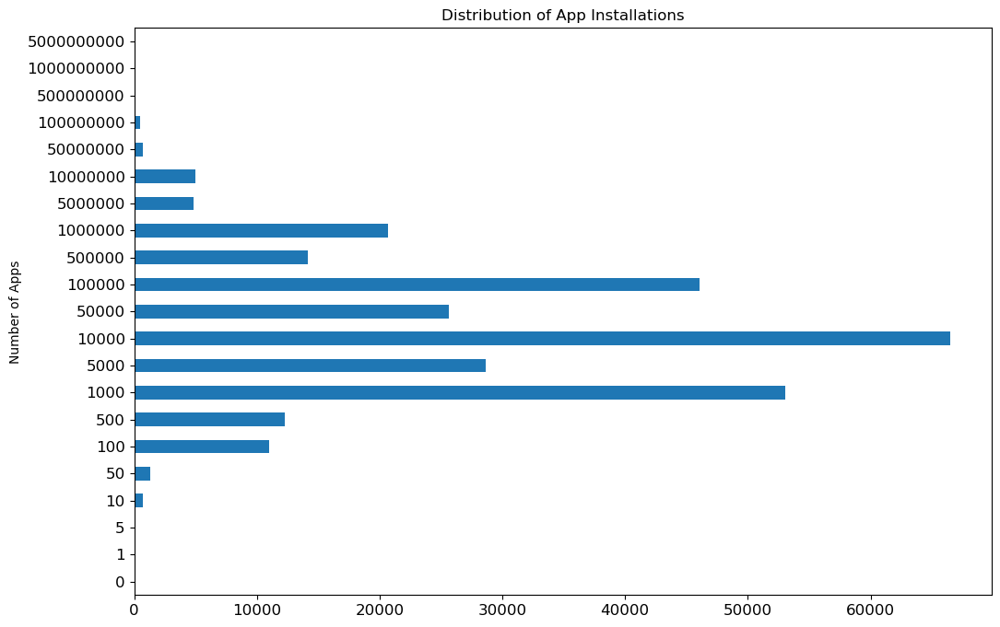

In [29]:
pd.options.plotting.backend = 'matplotlib'
installs_df.plot(kind = 'barh', legend = False, 
                 title = 'Distribution of App Installations',
                 xlabel = 'Number of Apps',
                 ylabel = 'Number of Installations',
                 figsize = (12,8),
                 fontsize = 12);

In [30]:
fig = px.histogram(playstore_df, x = 'Released', nbins = 40)
fig.update_layout(bargap=0.1,
                 title_text = 'Distribution of App Release Date')
fig.update_xaxes(title = 'Date of App Release')
fig.update_yaxes(title = 'Count of Apps')
fig.show()

In [31]:
fig = px.histogram(playstore_df, x = 'Rating', nbins = 20, histnorm = 'percent')
fig.update_layout(bargap=0.1, 
                 title_text = 'Distribution of Ratings for all Apps')
fig.update_yaxes(title='Percentage of Apps')
fig.show()

In [32]:
free = playstore_df['Free'].replace({True:'Free' , False:'Paid'})
inapp_purchase = playstore_df['In app purchases'].replace({True:'In App Purchases', False: 'No In App Purchases'})
content_rating = playstore_df['Content Rating']
editor_choice = playstore_df['Editor Choice'].replace({True:'Editor Choice', False: 'Not Editor Choice'})
fig = make_subplots(rows=2, cols=2, horizontal_spacing = 0.05, vertical_spacing = 0.05,
                    specs=[[{"type": "domain"}, {"type": "domain"}],
                           [{"type": "domain"}, {"type": "domain"}]], 
                    subplot_titles=['Paid v/s Free', 'In-App Purchases', 
                                    'Content Rating', 'Editor Choice'])

fig.add_trace(go.Pie(values=free.value_counts().values, 
                     labels = free.value_counts().index, 
                     hole=0.3),
              row=1, col=1)

fig.add_trace(go.Pie(values=inapp_purchase.value_counts().values, 
                     labels = inapp_purchase.value_counts().index, 
                     hole=0.3),
              row=1, col=2)

fig.add_trace(go.Pie(values=content_rating.value_counts().values, 
                     labels = content_rating.value_counts().index, 
                     hole=0.3),
              row=2, col=1)

fig.add_trace(go.Pie(values=editor_choice.value_counts().values, 
                     labels = editor_choice.value_counts().index, 
                     hole=0.3),
              row=2, col=2)

fig.update_layout(autosize=False, width=1000, height=1000)

fig.show()

In [33]:
price_data = playstore_df[(playstore_df['Free']==False) & (playstore_df['Price']<10)]
fig = px.histogram(price_data, x = 'Price', nbins=15, histnorm='percent')
fig.update_layout(bargap = 0.1,
                 title_text = 'Distribution of Price (Paid Apps)')
fig.update_yaxes(title = 'Percentage of Apps')
fig.update_xaxes(title = 'Price in USD')
fig.show()

In [34]:
category_df = pd.DataFrame(playstore_df.groupby('Category').agg({'Installs':'sum' , 
                                                                 'Rating':'mean', 
                                                                 'Rating Count':'sum',
                                                                 'Free':'sum',
                                                                 'App Id':'count'}))
category_df['Rating'] = category_df['Rating'].apply(lambda x: round(x,2))
category_df

,Installs,Rating,Rating Count,Free,App Id
Category,,,,,
Action,14027856750,3.95,510073422,4776,5076
Adventure,4147918045,4.06,112052258,3530,4111
Arcade,11824693385,4.07,246139064,5288,5603
Art & Design,866326950,3.96,13808126,2023,2087
Auto & Vehicles,1294964395,3.84,7571319,1581,1686
Beauty,288077960,3.98,3238612,820,823
Board,2862779850,4.08,53606033,2213,2422
Books & Reference,3149107786,4.36,47048370,18389,19176
Business,4084992430,3.92,41754300,7682,7890


In [35]:
fig = px.scatter(category_df, x = 'Installs', y = 'Rating Count', color = category_df.index, size = 'Rating', 
                 title = 'Relationship between Installs and Rating Count')

fig.show()

In [36]:
top_categories = category_df.sort_values('Rating', ascending = False).head(10).reset_index()['Category']

top_category_df = playstore_df[playstore_df['Category'].isin(top_categories)]

fig = px.box(top_category_df, x = 'Rating', y = 'Category', 
             title = 'Ratings Distribution for Top Rated Categories')

fig.show()

In [37]:
category_df.sort_values('Free', ascending = False, inplace = True)
category_df['Paid'] = category_df['App Id'] - category_df['Free']

fig = px.bar(category_df[['Free','Paid']])

fig.update_layout(
    title_text="Number of Apps in Different Categories",
    font_size = 10,
    legend=dict(yanchor="top", y=0.95, xanchor="left", x=0.88, font_size = 12, title_text = ''))
 
fig.update_xaxes(title_text="Category")
 
fig.update_yaxes(title_text="Number of Apps")

fig.show()

In [38]:
fig = px.scatter(playstore_df[playstore_df['Rating Count']<1000000], x = 'Rating Count', y = 'Rating', color = 'Category', 
                 title = 'Relationship Between App Rating and Count of Ratings')

fig.show()

In [39]:
playstore_df['Revenue'] = playstore_df['Price']*playstore_df['Installs']
paid_df = playstore_df[playstore_df['Free']==False]
paid_df.head()

,App Name,App Id,Category,Rating,Rating Count,Installs,Free,Price,Currency,Released,Content Rating,In app purchases,Editor Choice,Reviews,Developer,Revenue
263099,AutomateIt Pro - Automate tasks on your Android,AutomateItPro.mainPackage,Tools,3.44,6395,50000,False,3.49,USD,2011-06-12,Everyone,False,False,3605.0,SmarterApps Ltd,174500.0
222849,Deadly Dungeons,DeadlyDungeons.App,Role Playing,4.43,3243,50000,False,1.99,USD,2011-04-19,Everyone 10+,False,False,1067.0,code_zombie,99500.0
214346,OBD Fusion (Car Diagnostics),OCTech.Mobile.Applications.TouchScan,Communication,3.81,1354,50000,False,4.99,USD,2012-06-07,Everyone,True,False,780.0,"OCTech, LLC",249500.0
248117,Siddur Ashkenaz (Paid Version),Sidur.Ashkenaz.paid,Books & Reference,4.60,10,100,False,1.99,USD,2010-10-07,Everyone,False,False,6.0,RobertR,199.0
248110,Siddur Nosach Sfarad (Paid),Sidur.NosachSfarad.paid,Books & Reference,4.33,9,50,False,1.99,USD,2010-10-07,Everyone,False,False,6.0,RobertR,99.5


In [40]:
top_20_apps = paid_df.sort_values('Revenue', ascending = False).head(20)

fig = make_subplots(specs=[[{"secondary_y": True}]])
 
fig.add_trace(
    go.Bar(x=top_20_apps['App Name'], y=top_20_apps['Revenue'], name="Revenue"),
    secondary_y=False)

fig.add_trace(
    go.Scatter(x=top_20_apps['App Name'], y=top_20_apps['Installs'], name="Installs"),
    secondary_y=False)

fig.add_trace(
    go.Scatter(x=top_20_apps['App Name'], y=top_20_apps['Rating'], name="Rating"),
    secondary_y=True,)

fig.update_layout(
    title_text="Top 20 Apps by Revenue", 
    legend_font_size = 12, 
    font_size = 10,
    legend=dict(yanchor="top", y=0.95, xanchor="left", x=0.6))
 
fig.update_xaxes(title_text="App Name", title_font_size = 14)
 
fig.update_yaxes(title_text="Revenue in USD/Installs", secondary_y=False, title_font_size = 14)
fig.update_yaxes(title_text="Rating", secondary_y=True, title_font_size = 14)

In [41]:
category_price = pd.DataFrame(playstore_df[playstore_df['Free'] == False].groupby('Category')[['Price','Rating']].agg('mean'))
category_price['Price'] = category_price['Price'].apply(lambda x: round(x,2))
category_price['Rating'] = category_price['Rating'].apply(lambda x: round(x,2))
category_price

,Price,Rating
Category,,
Action,3.34,4.07
Adventure,4.59,4.22
Arcade,3.23,4.18
Art & Design,4.22,4.12
Auto & Vehicles,6.06,3.84
Beauty,2.32,4.63
Board,6.29,4.14
Books & Reference,7.15,4.29
Business,9.03,3.92


In [42]:
fig = px.line_polar(category_price[category_price['Price']<10], 
                    r = 'Price',
                    theta = category_price[category_price['Price']<10].index, 
                    line_close = True, 
                    color_discrete_sequence=px.colors.qualitative.G10)

fig.update_layout(autosize=False, width=800, height=800,
                 title_text = 'Category-wise Mean Price of Paid Apps')

fig.show()

In [43]:
editor_choice_installs = playstore_df[playstore_df['Installs']<50000000]

fig = make_subplots(rows=1, cols=2, horizontal_spacing = 0.15)

fig.add_trace(go.Box(y= playstore_df['Rating'], x = playstore_df['Editor Choice'], 
                     name = 'Impact of Editor Choice on Rating'),
              row=1,col=1)

fig.add_trace(go.Box(y = editor_choice_installs['Installs'], x = editor_choice_installs['Editor Choice'], 
                     name = 'Impact of Editor Choice on Installs'),
              row = 1, col = 2)

fig.update_layout(title='Impact of Editor Choice Listing',
                 yaxis_title = 'Rating',
                 yaxis2_title = 'Number of Installs')


fig.show()

In [44]:
playstore_df['Year of Release'] = playstore_df['Released'].dt.year
paid_df = playstore_df[playstore_df['Free']==False]

yearly_revenue = paid_df.pivot_table(index = 'Year of Release', columns = 'Content Rating', values = 'Revenue', aggfunc = 'sum')
yearly_revenue

Content Rating,Everyone,Everyone 10+,Mature 17+,Teen
Year of Release,,,,
2010,1.291640e+08,1.148290e+06,1508.90,14952784.0
2011,9.598325e+07,7.843307e+07,8102765.00,2909997.0
2012,1.327506e+08,1.173786e+07,14702799.00,20188954.0
2013,1.009157e+08,1.122593e+07,8634640.00,14922683.0
2014,7.578606e+07,2.641406e+07,2013842.00,25711077.0
2015,6.646514e+07,6.587544e+06,11828558.00,23490170.5
2016,1.648164e+08,1.017556e+07,1395650.00,27448204.3
2017,5.277412e+07,2.873438e+07,1172087.00,14874830.3
2018,6.839328e+07,9.388983e+06,1137085.40,18024490.4


In [45]:
pd.options.plotting.backend = 'plotly'

fig = yearly_revenue.plot(kind = 'area', title = 'Revenue by App Release Year & Content Rating')

fig.update_yaxes(title = 'Revenue in Millions (USD)')
fig.show()